In [16]:
import requests

url = 'https://api.jikan.moe/v4/top/anime'
data = requests.get(url)
if data.status_code == 200:
    data = data.json()
    for e in data['data']:
        print(e['title'])

Sousou no Frieren
Fullmetal Alchemist: Brotherhood
Steins;Gate
Gintama°
Shingeki no Kyojin Season 3 Part 2
Gintama: The Final
Gintama'
Hunter x Hunter (2011)
Gintama': Enchousen
Ginga Eiyuu Densetsu
Kaguya-sama wa Kokurasetai: Ultra Romantic
Bleach: Sennen Kessen-hen
Gintama.
Fruits Basket: The Final
Gintama
Clannad: After Story
Koe no Katachi
3-gatsu no Lion 2nd Season
Code Geass: Hangyaku no Lelouch R2
Kusuriya no Hitorigoto
Gintama Movie 2: Kanketsu-hen - Yorozuya yo Eien Nare
Shingeki no Kyojin: The Final Season - Kanketsu-hen
Gintama.: Shirogane no Tamashii-hen - Kouhan-sen
Monster
Owarimonogatari 2nd Season


# Cargando los datos

## 1. Tráfico a tiempo real

link: https://valencia.opendatasoft.com/explore/dataset/estat-transit-temps-real-estado-trafico-tiempo-real/table/

link: https://valencia.opendatasoft.com/explore/dataset/intensitat-transit-trams-intensidad-trafico-tramos/table/?location=16,39.47819,-0.37204&

### 1.1 Intensidad por tramo

In [1]:
import requests

url = 'https://valencia.opendatasoft.com/api/explore/v2.1/catalog/datasets/intensitat-transit-trams-intensidad-trafico-tramos/records?limit=20'
data = requests.get(url)
data.json()


{'total_count': 392,
 'results': [{'gid': 795,
   'idtramo': 'A302',
   'lectura': -1,
   'des_tramo': 'Mª CRISTINA, AVDA.',
   'estado': '0',
   'observaciones': None,
   'imv': '6005',
   'tipo_vehiculo': None,
   'geo_shape': {'type': 'Feature',
    'geometry': {'coordinates': [[-0.37685260453815844, 39.472178070752996],
      [-0.3777732980725336, 39.47340000130253],
      [-0.37850581977548237, 39.47406008956129]],
     'type': 'LineString'},
    'properties': {}},
   'geo_point_2d': {'lon': -0.3776369077189324, 'lat': 39.47315782773115}},
  {'gid': 794,
   'idtramo': 'A222',
   'lectura': 169,
   'des_tramo': 'SAGUNTO De Santa Mónica a Maximiliano Thous',
   'estado': '0',
   'observaciones': None,
   'imv': '4871',
   'tipo_vehiculo': None,
   'geo_shape': {'type': 'Feature',
    'geometry': {'coordinates': [[-0.37504762347871445, 39.48153249690553],
      [-0.37496354378403707, 39.483841070358864],
      [-0.3745269606880496, 39.48534673541321],
      [-0.3753901314350256, 39.4

In [ ]:
import requests
import pandas as pd
from shapely.geometry import LineString

url = 'https://valencia.opendatasoft.com/api/explore/v2.1/catalog/datasets/intensitat-transit-trams-intensidad-trafico-tramos/records?limit=20'
data = requests.get(url)

data_list = []
for result in data.json()['results']:
    row = {
        'gid': result['gid'],
        'idtramo': result['idtramo'],
        'lectura': result['lectura'],
        'des_tramo': result['des_tramo'],
        'estado': result['estado'],
        'observaciones': result['observaciones'],
        'imv': result['imv'],
        'estado': result['estado'],
        'tipo_vehiculo': result['tipo_vehiculo'],
        
        'geo_point_lon': result['geo_point_2d']['lon'],
        'geo_point_lat': result['geo_point_2d']['lat'],
        'geo_shape_type': result['geo_shape']['type'],
        'geo_shape_geometry_type': result['geo_shape']['geometry']['type'],
        'geo_shape_coordinates': result['geo_shape']['geometry']['coordinates']
    }
    data_list.append(row)

df_trafico1 = pd.DataFrame(data_list)
df_trafico1['geo_shape_geometry'] = df_trafico1['geo_shape_coordinates'].apply(lambda coords: LineString(coords))

### 1.2 Estado trafico tiempo real

In [189]:
import requests
import pandas as pd
from shapely.geometry import LineString

url = 'https://valencia.opendatasoft.com/api/explore/v2.1/catalog/datasets/estat-transit-temps-real-estado-trafico-tiempo-real/records?'
data = requests.get(url)

data_list = []
for result in data.json()['results']:
    row = {
        'gid': result['gid'],
        'denominacion': result['denominacion'],
        'estado': result['estado'],
        'idtramo': result['idtramo'],
        'geo_point_lon': result['geo_point_2d']['lon'],
        'geo_point_lat': result['geo_point_2d']['lat'],
        'geo_shape_type': result['geo_shape']['type'],
        'geo_shape_geometry_type': result['geo_shape']['geometry']['type'],
        'geo_shape_coordinates': result['geo_shape']['geometry']['coordinates']
    }
    data_list.append(row)

df_trafico = pd.DataFrame(data_list)
df_trafico['geo_shape_geometry'] = df_trafico['geo_shape_coordinates'].apply(lambda coords: LineString(coords))
df_trafico['geo_point_2d'] = df_trafico.apply(lambda row: Point(row['geo_point_lon'], row['geo_point_lat']), axis=1)

df_trafico.head()

,gid,denominacion,estado,idtramo,geo_point_lon,geo_point_lat,geo_shape_type,geo_shape_geometry_type,geo_shape_coordinates,geo_shape_geometry,geo_point_2d
0,1859,MAURO GUILLEN,0,383,-0.382994,39.482316,Feature,LineString,"[[-0.3820981057104063, 39.482693705752965], [-...",LINESTRING (-0.3820981057104063 39.48269370575...,POINT (-0.3829941269357674 39.482316435327604)
1,1879,CAMI DE LES MORERES CAP A PONT DE LES DRASSANES,0,461,-0.338110,39.451941,Feature,LineString,"[[-0.3408270279078561, 39.45123933772069], [-0...",LINESTRING (-0.3408270279078561 39.45123933772...,POINT (-0.3381103925496891 39.45194083591484)
2,1886,COMTE LUMIARES (CAP A AV. CONSTITUCIO),0,474,-0.372096,39.496299,Feature,LineString,"[[-0.37145879938561477, 39.49809788734206], [-...",LINESTRING (-0.3714587993856148 39.49809788734...,POINT (-0.3720959731663345 39.496298550798365)
3,1881,CAMI CANAL D'EIXIDA,0,463,-0.335289,39.451224,Feature,LineString,"[[-0.33510290823382965, 39.45234417803024], [-...",LINESTRING (-0.3351029082338296 39.45234417803...,POINT (-0.3352885564004821 39.451224433666624)
4,1876,GASPAR AGUILAR (DES DE TRES CREUS A JAIME BELT...,0,457,-0.392450,39.453175,Feature,LineString,"[[-0.39455666334773454, 39.450068478955], [-0....",LINESTRING (-0.3945566633477345 39.45006847895...,POINT (-0.3924498904490414 39.45317459616689)


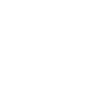

In [19]:
df_trafico['geo_shape_geometry']

## 2. Temperatura

link: https://valencia.opendatasoft.com/explore/dataset/temperatura-valencia-2018-2022/table/

In [191]:
import requests
import pandas as pd
from shapely.geometry import LineString

url_temp = 'https://valencia.opendatasoft.com/api/explore/v2.1/catalog/datasets/temperatura-valencia-2018-2022/records?limit=20'
data = requests.get(url_temp)
data.json()
data_list = []
for result in data.json()['results']:
    row = {
        'fecha': result['fecha'],
        'nombre': result['nombre'],
        'provincia': result['provincia'],
        'tmed': result['tmed'],
        'tmax': result['tmax'],
        'horatmax': result['horatmax'],
        'horatmin': result['horatmin'],
        'prec': result['prec'],
        'dir': result['dir'],
        'velmedia': result['velmedia'],
        'racha': result['racha'],
        'horaracha': result['horaracha']
    }
    data_list.append(row)

df_temp = pd.DataFrame(data_list)

df_temp.head()

,fecha,nombre,provincia,tmed,tmax,horatmax,horatmin,prec,dir,velmedia,racha,horaracha
0,2018-01-01,"VALÈNCIA, VIVEROS",VALENCIA,"13,9","17,6",14:40,07:00,"0,0",22,"3,9","13,9",12:40
1,2018-01-02,"VALÈNCIA, VIVEROS",VALENCIA,"16,4","20,6",15:30,06:30,"0,0",26,"3,3","10,6",13:40
2,2018-01-06,"VALÈNCIA, VIVEROS",VALENCIA,"11,5","15,2",14:20,23:59,"5,2",36,"1,9","8,3",12:00
3,2018-01-08,"VALÈNCIA, VIVEROS",VALENCIA,"10,3","15,3",13:20,07:00,"0,0",14,"0,8","4,4",13:50
4,2018-01-14,"VALÈNCIA, VIVEROS",VALENCIA,"11,0","15,0",14:50,23:50,"0,0",26,"1,9","10,6",03:10


## 3. Ruido 
link: https://valencia.opendatasoft.com/explore/dataset/mapa-soroll-24h-mapa-ruido-24h/table/

In [193]:

import requests
import pandas as pd
from shapely.geometry import MultiPolygon, Polygon

url_ruido = 'https://valencia.opendatasoft.com/api/explore/v2.1/catalog/datasets/mapa-soroll-24h-mapa-ruido-24h/records?limit=20'
data = requests.get(url_ruido)
data.json()
data_list = []
for result in data.json()['results']:
    row = {
        'gridcode': result['gridcode'],
        'gid': result['gid'],
#         'properties': result['properties'],

        'geo_point_lon': result['geo_point_2d']['lon'],
        'geo_point_lat': result['geo_point_2d']['lat'],
        'geo_shape_type': result['geo_shape']['type'],
        'geo_shape_geometry_type': result['geo_shape']['geometry']['type'],
        'geo_shape_coordinates': result['geo_shape']['geometry']['coordinates']
    }
    data_list.append(row)

df_ruido = pd.DataFrame(data_list)


   
    
def to_polygon(row):
    coordinates = row['geo_shape_coordinates']
    geometry = row['geo_shape_geometry_type']
    if geometry=='MultiPolygon':
        all_semi_polygons = []
        for semipolygon in coordinates:
#             semipolygon = 
#             for polygon in semipolygon:
#                 print(True)
#                 semipolygon.append(Polygon(polygon))
            all_semi_polygons.append(Polygon(semipolygon[0]))
        return MultiPolygon(all_semi_polygons)
    else:
        semipolygon = []
        for polygon in coordinates:
            semipolygon.append(Polygon(polygon))
                  
        return MultiPolygon(semipolygon)

df_ruido['geo_shape_geometry'] = df_ruido.apply(to_polygon, axis=1)
df_ruido['geo_point_2d'] = df_ruido.apply(lambda row: Point(row['geo_point_lon'], row['geo_point_lat']), axis=1)

df_ruido.head()

,gridcode,gid,geo_point_lon,geo_point_lat,geo_shape_type,geo_shape_geometry_type,geo_shape_coordinates,geo_shape_geometry,geo_point_2d
0,1,2,-0.323739,39.366891,Feature,MultiPolygon,"[[[[-0.320771222979008, 39.35727888134497], [-...",MULTIPOLYGON (((-0.320771222979008 39.35727888...,POINT (-0.3237392638254029 39.36689075613487)
1,1,5,-0.383946,39.488260,Feature,MultiPolygon,"[[[[-0.324591503216445, 39.48407966454563], [-...",MULTIPOLYGON (((-0.324591503216445 39.48407966...,POINT (-0.3839458886503934 39.48825964626697)
2,2,15,-0.387661,39.498763,Feature,MultiPolygon,"[[[[-0.355219091748767, 39.49252275226979], [-...",MULTIPOLYGON (((-0.355219091748767 39.49252275...,POINT (-0.3876610998962941 39.49876263098719)
3,2,16,-0.372451,39.524311,Feature,MultiPolygon,"[[[[-0.291355101245448, 39.558686445416974], [...",MULTIPOLYGON (((-0.291355101245448 39.55868644...,POINT (-0.3724513695235123 39.52431138976168)
4,3,20,-0.352795,39.451943,Feature,MultiPolygon,"[[[[-0.322272755242932, 39.46011855399632], [-...",MULTIPOLYGON (((-0.322272755242932 39.46011855...,POINT (-0.3527951971241042 39.451943046981334)


In [197]:
data.json()['results']

[{'gridcode': 1,
  'gid': 2,
  'geo_shape': {'type': 'Feature',
   'geometry': {'coordinates': [[[[-0.320771222979008, 39.35727888134497],
       [-0.32080155830929, 39.35730016453909],
       [-0.32081750680952, 39.357332243127885],
       [-0.320856138282207, 39.35734772744166],
       [-0.320871012361428, 39.357380592068765],
       [-0.320912031552671, 39.35739432959901],
       [-0.320925353674875, 39.35742832961865],
       [-0.320966850441302, 39.35744171777731],
       [-0.320979456293887, 39.35747624182215],
       [-0.321022027555785, 39.3574888439166],
       [-0.321033917138692, 39.357523891987256],
       [-0.321077562896317, 39.35753570801635],
       [-0.321088497441271, 39.35757145479045],
       [-0.321132978926826, 39.35758265943035],
       [-0.321143197201705, 39.3576189302317],
       [-0.321189350103896, 39.357628912111096],
       [-0.321197658267676, 39.35766658032666],
       [-0.321244646898465, 39.3576759508149],
       [-0.321252358175634, 39.35771405572089]

## 4. Colecamins
link: https://valencia.opendatasoft.com/explore/dataset/colecamins/table/

In [184]:
import geopandas as gpd
from shapely.geometry import Point

gdf = gpd.read_file('./colecamins.geojson')

gdf['geo_point_lon'] = gdf['geo_point_2d'].apply(lambda x: x['lon'])
gdf['geo_point_lat'] = gdf['geo_point_2d'].apply(lambda x: x['lat'])

gdf['geo_point_2d'] = gdf.apply(lambda row: Point(row['geo_point_lon'], row['geo_point_lat']), axis=1)
gdf.head()

,capa,objectid,st_length_shape,geo_point_2d,geometry,geo_point_lon,geo_point_lat
0,CEIP Alejandra Soler,734,334.828666,POINT (-0.37616 39.46109),"LINESTRING (-0.37786 39.46039, -0.37657 39.460...",-0.376158,39.461092
1,CEIP Alejandra Soler,735,571.810322,POINT (-0.37227 39.46071),"LINESTRING (-0.36986 39.46068, -0.37052 39.460...",-0.372271,39.460713
2,CEIP L'Albereda,743,1022.940404,POINT (-0.34592 39.45695),"LINESTRING (-0.34768 39.46068, -0.34805 39.459...",-0.345922,39.456949
3,CEIP 8 de Març,745,421.373645,POINT (-0.39406 39.46514),"LINESTRING (-0.39190 39.46472, -0.39206 39.464...",-0.394059,39.465137
4,Colegio Salesianos,642,440.465330,POINT (-0.36985 39.49121),"LINESTRING (-0.36814 39.49250, -0.36836 39.492...",-0.369848,39.491214


In [183]:
gdf

,capa,objectid,st_length_shape,geo_point_2d,geometry,geo_point_lon,geo_point_lat
0,CEIP Alejandra Soler,734,334.828666,"{'lon': -0.3761580313606199, 'lat': 39.4610922...","LINESTRING (-0.37786 39.46039, -0.37657 39.460...",-0.376158,39.461092
1,CEIP Alejandra Soler,735,571.810322,"{'lon': -0.3722711587518029, 'lat': 39.4607126...","LINESTRING (-0.36986 39.46068, -0.37052 39.460...",-0.372271,39.460713
2,CEIP L'Albereda,743,1022.940404,"{'lon': -0.34592175373266293, 'lat': 39.456948...","LINESTRING (-0.34768 39.46068, -0.34805 39.459...",-0.345922,39.456949
3,CEIP 8 de Març,745,421.373645,"{'lon': -0.39405861612794923, 'lat': 39.465136...","LINESTRING (-0.39190 39.46472, -0.39206 39.464...",-0.394059,39.465137
4,Colegio Salesianos,642,440.465330,"{'lon': -0.36984815629386164, 'lat': 39.491213...","LINESTRING (-0.36814 39.49250, -0.36836 39.492...",-0.369848,39.491214
...,...,...,...,...,...,...,...
101,CEIP Chiner de Villarroya,714,180.248258,"{'lon': -0.3333621361298851, 'lat': 39.4723683...","LINESTRING (-0.33354 39.47159, -0.33352 39.471...",-0.333362,39.472368
102,CEIP Chiner de Villarroya,716,136.404326,"{'lon': -0.33237098550839983, 'lat': 39.474090...","LINESTRING (-0.33161 39.47398, -0.33217 39.474...",-0.332371,39.474090
103,CEIP Antonio Machado,724,371.331314,"{'lon': -0.3735136349445927, 'lat': 39.4970236...","LINESTRING (-0.37245 39.49614, -0.37293 39.496...",-0.373514,39.497024
104,CEIP Jaime Balmes,726,367.076438,"{'lon': -0.3691481692217249, 'lat': 39.4594493...","LINESTRING (-0.36972 39.46083, -0.36988 39.460...",-0.369148,39.459449


In [5]:
# Importar las librerías necesarias
import streamlit as st
import pandas as pd
import geopandas as gpd
import folium
from geopy.distance import geodesic
from streamlit_folium import folium_static

# Cargar los datos de los colegios desde un CSV
@st.cache
def load_data():
    gdf = gpd.read_file('./colecamins.geojson')
    return gdf

# Función para calcular la distancia entre dos puntos
def calculate_distance(point1, point2):
    return geodesic(point1, point2).kilometers

# Crear la interfaz de Streamlit
st.title('Recomendador de Rutas a Colegios')

# Entrada de la ubicación del usuario
user_lat = st.number_input('Ingrese su latitud:', value=39.47)
user_lon = st.number_input('Ingrese su longitud:', value=-0.38)

# Cargar la base de datos de colegios
data = load_data()

# Convertir la ubicación del usuario a una tupla
user_location = (user_lat, user_lon)

# Calcular la distancia a cada colegio y agregarla al DataFrame
data['distance'] = data.apply(lambda row: calculate_distance(user_location, (row['geo_point_2d']['lat'], row['geo_point_2d']['lon'])), axis=1)

# Encontrar el colegio más cercano
nearest_school = data.loc[data['distance'].idxmin()]

# Mostrar información del colegio más cercano
st.write(f"El colegio más cercano es: **{nearest_school['capa']}**")
st.write(f"Distancia: **{nearest_school['distance']:.2f} km**")

# Crear un mapa para mostrar la ruta
mapa = folium.Map(location=user_location, zoom_start=15)
folium.Marker(user_location, tooltip='Ubicación del Usuario', icon=folium.Icon(color='blue')).add_to(mapa)
folium.Marker((nearest_school['geo_point_2d']['lat'], nearest_school['geo_point_2d']['lon']), tooltip=nearest_school['capa'], icon=folium.Icon(color='green')).add_to(mapa)
folium.PolyLine([(user_lat, user_lon), (nearest_school['geo_point_2d']['lat'], nearest_school['geo_point_2d']['lon'])], color='blue').add_to(mapa)

# Mostrar el mapa en Streamlit
folium_static(mapa)


ModuleNotFoundError: No module named 'streamlit'

In [ ]:
 pip install streamlit pandas folium geopy streamlit_folium --user